<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Generative adversarial networks</b></h3>



В этом домашнем задании вы обучите GAN генерировать лица людей и посмотрите на то, как можно оценивать качество генерации

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.io import read_image
from torchvision.utils import save_image, make_grid

import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import accuracy_score
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import clear_output
import cv2

import os
from tqdm.notebook import tqdm
from datetime import datetime
import pytz

%matplotlib inline
sns.set(style='darkgrid', font_scale=1.2)

In [ ]:
! kaggle datasets download tommykamaz/faces-dataset-small
! unzip -q faces-dataset-small.zip

! mkdir faces_dataset
! mv faces_dataset_small faces_dataset

100% 3.98G/3.99G [01:43<00:00, 37.8MB/s]
100% 3.99G/3.99G [01:43<00:00, 41.4MB/s]


## Часть 1. Подготовка данных (1 балл)

В качестве обучающей выборки возьмем часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset), который содержит изображения лиц людей в высоком разрешении (1024х1024). Оригинальный датасет очень большой, поэтому мы возьмем его часть. Скачать датасет можно [здесь](https://drive.google.com/file/d/1KWPc4Pa7u2TWekUvNu9rTSO0U2eOlZA9/view?usp=sharing)

Давайте загрузим наши изображения. Напишите функцию, которая строит DataLoader для изображений, при этом меняя их размер до нужного значения (размер 1024 слишком большой, поэтому мы рекомендуем взять размер 128 либо немного больше)

In [ ]:
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield b.to(self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)


def get_dataloader(image_size, batch_size):
  """
  Builds dataloader for training data.
  Use tt.Compose and tt.Resize for transformations
  :param image_size: height and wdith of the image
  :param batch_size: batch_size of the dataloader
  :returns: DataLoader object 
  """
  DATA_DIR = './faces_dataset'

  # ignores labels of dataset
  collate_fn = lambda batch: torch.stack([elem[0] for elem in batch])

  # dataset
  ds = ImageFolder(DATA_DIR, transform=tt.Compose([
      tt.Resize(image_size),
      tt.ToTensor()]))
  # dataloader
  dl = DataLoader(ds, batch_size, shuffle=True, num_workers=2, collate_fn=collate_fn)
  dl = DeviceDataLoader(dl, device)
  return dl

In [ ]:
def show_images(images, nmax=64, nrow=8, size=8):
    fig, ax = plt.subplots(figsize=(size, size))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(images.detach().cpu()[:nmax], nrow=nrow).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images in dl:
        show_images(images, nmax)
        break

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
device

device(type='cuda')

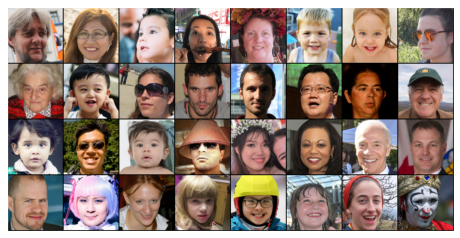

In [ ]:
image_size = 128
batch_size = 32

train_dl = get_dataloader(image_size, batch_size)

# посмотрим, как выглядит батч
show_batch(train_dl)

## Часть 2. Построение и обучение модели (2 балла)

Сконструируйте генератор и дискриминатор. Помните, что:
* дискриминатор принимает на вход изображение (тензор размера `3 x image_size x image_size`) и выдает вероятность того, что изображение настоящее (тензор размера 1)

* генератор принимает на вход тензор шумов размера `latent_size x 1 x 1` и генерирует изображение размера `3 x image_size x image_size`

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 128 x 128

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 64 x 64

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 32 x 32

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 16 x 16

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 8 x 8

    nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())


discriminator = discriminator.to(device)

In [ ]:
latent_size = 256

generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(32),
    nn.ReLU(True),
    # out: 32 x 64 x 64

    nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
    nn.Sigmoid()
    # out: 3 x 128 x 128
)


generator = generator.to(device)

Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:
1. Учим дискриминатор:
  * берем реальные изображения и присваиваем им метку 1
  * генерируем изображения генератором и присваиваем им метку 0
  * обучаем классификатор на два класса

2. Учим генератор:
  * генерируем изображения генератором и присваиваем им метку 0
  * предсказываем дискриминаторором, реальное это изображение или нет


В качестве функции потерь берем бинарную кросс-энтропию

In [ ]:
lr = 3e-4

model = {
    "discriminator": discriminator,
    "generator": generator
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

In [ ]:
# Directory for saving intermediate results
CHECKPOINT_DIR = '/content/drive/MyDrive/DS_data/gan_faces_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

In [ ]:
def save_model(epoch=-1, final=False):
  """
  Saving weights of model
  """
  if final:
    tz = pytz.timezone('Europe/Moscow')
    dt = datetime.now().astimezone(tz=tz).strftime("%d-%m-%Y_%H:%M:%S")
    path_weights = os.path.join(CHECKPOINT_DIR, f'gan_weights_final_{dt}.pt')
  else:
    path_weights = os.path.join(CHECKPOINT_DIR, f'gan_weights_{epoch+1:0=4d}.pt') 

  torch.save({
            'discriminator_state_dict': discriminator.state_dict(),
            'generator_state_dict': generator.state_dict()
            }, path_weights)

In [ ]:
# Losses & scores
losses_g = []
losses_d = []
real_scores = []
fake_scores = []

In [ ]:
def fit(model, criterion, epochs, lr, start_epoch=0):
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()
    
    # Create optimizers
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(), 
                                          lr=lr/2, betas=(0.5, 0.999), weight_decay=1e-5),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr*2, betas=(0.5, 0.999), weight_decay=1e-5)
    }
    
    for epoch in range(start_epoch, start_epoch + epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images in tqdm(train_dl):
            # Train discriminator
            # Clear discriminator gradients
            optimizer["discriminator"].zero_grad()

            # Pass real images through discriminator
            real_preds = model["discriminator"](real_images)
            real_targets = torch.ones(real_images.size(0), 1, device=device)
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()
            
            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)

            # Pass fake images through discriminator
            fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
            fake_preds = model["discriminator"](fake_images)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Update discriminator weights
            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())


            # Train generator
            # Clear generator gradients
            optimizer["generator"].zero_grad()
            
            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)
            
            # Try to fool the discriminator
            preds = model["discriminator"](fake_images)
            targets = torch.ones(batch_size, 1, device=device)
            loss_g = criterion["generator"](preds, targets)
            
            # Update generator weights
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())
            
        # Record losses & scores
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))

        # Saving model
        if (epoch+1)%10 == 0:
          save_model(epoch=epoch)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, start_epoch+epochs, 
            losses_g[-1], losses_d[-1], real_scores[-1], fake_scores[-1]))

        # Showing intermediate results 
        if (epoch+1)%5 == 0:
          show_images(fake_images)
          plt.title(f'Epoch {epoch+1}, generated images')
          plt.show()
        
    
    return losses_g, losses_d, real_scores, fake_scores

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 9.6748, loss_d: 0.6012, real_score: 0.8733, fake_score: 0.1628


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 3.5127, loss_d: 0.9240, real_score: 0.7184, fake_score: 0.2880


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 3.8153, loss_d: 0.8842, real_score: 0.7229, fake_score: 0.2762


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 3.2306, loss_d: 0.9198, real_score: 0.6908, fake_score: 0.3040


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 3.7019, loss_d: 0.8841, real_score: 0.7122, fake_score: 0.2888


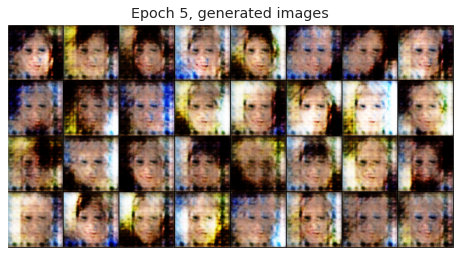

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 3.6503, loss_d: 0.9254, real_score: 0.6976, fake_score: 0.2991


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 3.6628, loss_d: 0.8312, real_score: 0.7188, fake_score: 0.2806


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 3.7853, loss_d: 0.8357, real_score: 0.7281, fake_score: 0.2743


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 3.8765, loss_d: 0.8623, real_score: 0.7197, fake_score: 0.2759


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 4.0259, loss_d: 0.8094, real_score: 0.7348, fake_score: 0.2640


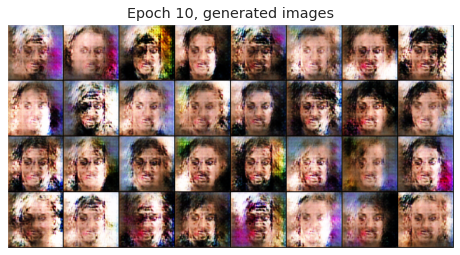

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 4.2735, loss_d: 0.7116, real_score: 0.7542, fake_score: 0.2393


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 4.2202, loss_d: 0.7362, real_score: 0.7598, fake_score: 0.2386


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 4.2433, loss_d: 0.7863, real_score: 0.7460, fake_score: 0.2512


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 4.3156, loss_d: 0.7345, real_score: 0.7613, fake_score: 0.2378


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 4.2434, loss_d: 0.6664, real_score: 0.7721, fake_score: 0.2257


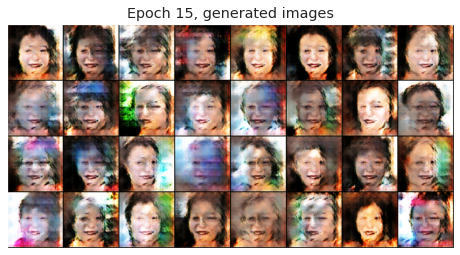

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 4.5169, loss_d: 0.6425, real_score: 0.7812, fake_score: 0.2116


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 4.6060, loss_d: 0.6153, real_score: 0.7969, fake_score: 0.2068


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 4.5101, loss_d: 0.6090, real_score: 0.7923, fake_score: 0.2016


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 4.9659, loss_d: 0.6021, real_score: 0.8043, fake_score: 0.1968


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 4.6169, loss_d: 0.5944, real_score: 0.8029, fake_score: 0.1921


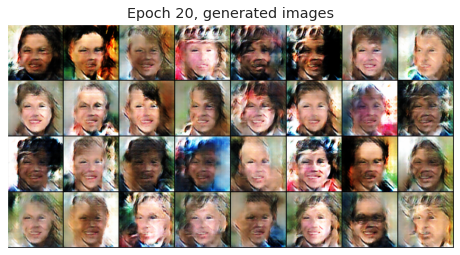

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 4.6189, loss_d: 0.5398, real_score: 0.8192, fake_score: 0.1801


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 4.7135, loss_d: 0.5078, real_score: 0.8265, fake_score: 0.1712


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 4.8365, loss_d: 0.5199, real_score: 0.8312, fake_score: 0.1669


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 4.7023, loss_d: 0.4868, real_score: 0.8339, fake_score: 0.1662


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 4.8683, loss_d: 0.4859, real_score: 0.8343, fake_score: 0.1606


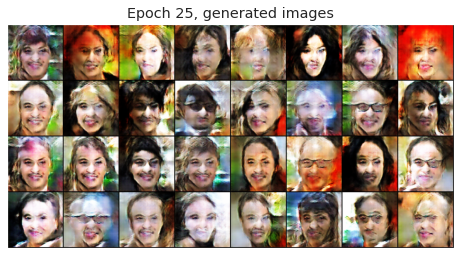

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 4.8425, loss_d: 0.4727, real_score: 0.8408, fake_score: 0.1594


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 4.9657, loss_d: 0.3995, real_score: 0.8562, fake_score: 0.1402


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 5.1821, loss_d: 0.5082, real_score: 0.8389, fake_score: 0.1605


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 5.0019, loss_d: 0.4898, real_score: 0.8409, fake_score: 0.1610


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 5.1137, loss_d: 0.4403, real_score: 0.8558, fake_score: 0.1443


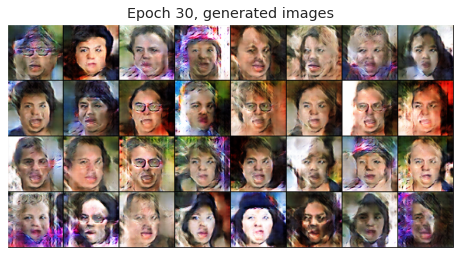

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 4.8716, loss_d: 0.3490, real_score: 0.8745, fake_score: 0.1239


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 5.0320, loss_d: 0.4899, real_score: 0.8441, fake_score: 0.1532


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 4.9591, loss_d: 0.3907, real_score: 0.8667, fake_score: 0.1321


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 5.0969, loss_d: 0.4393, real_score: 0.8565, fake_score: 0.1416


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 5.4501, loss_d: 0.4271, real_score: 0.8633, fake_score: 0.1331


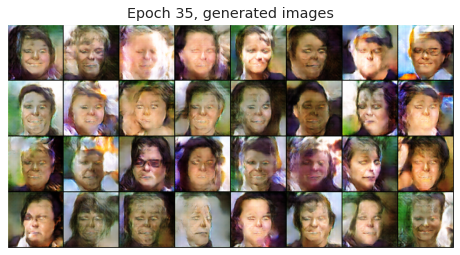

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 4.8665, loss_d: 0.4050, real_score: 0.8640, fake_score: 0.1360


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 4.9272, loss_d: 0.4842, real_score: 0.8484, fake_score: 0.1502


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 4.7545, loss_d: 0.3697, real_score: 0.8719, fake_score: 0.1270


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 5.0503, loss_d: 0.3124, real_score: 0.8884, fake_score: 0.1120


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 5.2608, loss_d: 0.4250, real_score: 0.8638, fake_score: 0.1356


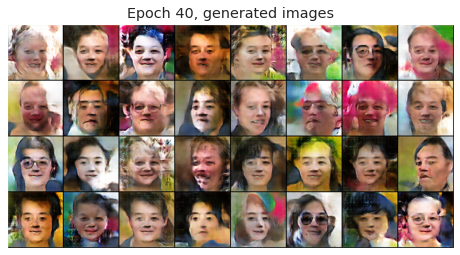

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 5.1167, loss_d: 0.3998, real_score: 0.8676, fake_score: 0.1333


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 5.1576, loss_d: 0.3697, real_score: 0.8750, fake_score: 0.1250


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 5.0804, loss_d: 0.3463, real_score: 0.8798, fake_score: 0.1164


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 5.0411, loss_d: 0.3058, real_score: 0.8914, fake_score: 0.1064


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 5.4432, loss_d: 0.3462, real_score: 0.8831, fake_score: 0.1163


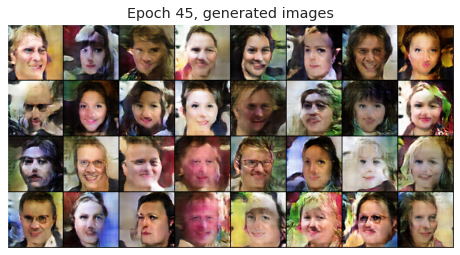

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 5.1337, loss_d: 0.3651, real_score: 0.8818, fake_score: 0.1159


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 5.0426, loss_d: 0.2367, real_score: 0.9117, fake_score: 0.0892


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 5.5957, loss_d: 0.3871, real_score: 0.8755, fake_score: 0.1222


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 5.3732, loss_d: 0.4077, real_score: 0.8733, fake_score: 0.1237


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 4.9094, loss_d: 0.2755, real_score: 0.9020, fake_score: 0.0984


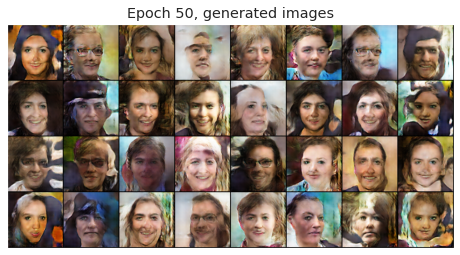

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 5.1139, loss_d: 0.2893, real_score: 0.9038, fake_score: 0.0985


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 5.3381, loss_d: 0.2148, real_score: 0.9194, fake_score: 0.0779


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 5.5917, loss_d: 0.5559, real_score: 0.8560, fake_score: 0.1461


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 4.8371, loss_d: 0.2532, real_score: 0.9065, fake_score: 0.0931


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 5.2321, loss_d: 0.2227, real_score: 0.9200, fake_score: 0.0793


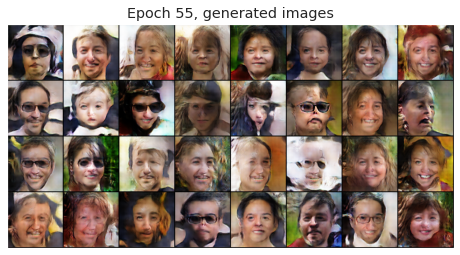

  0%|          | 0/99 [00:00<?, ?it/s]

In [ ]:
# Первые 50 эпох
epochs = 50

history = fit(model, criterion, epochs, lr)

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [51/50], loss_g: 5.0462, loss_d: 0.3378, real_score: 0.8842, fake_score: 0.1181


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [52/50], loss_g: 5.0544, loss_d: 0.3501, real_score: 0.8803, fake_score: 0.1167


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [53/50], loss_g: 5.0350, loss_d: 0.3214, real_score: 0.8915, fake_score: 0.1101


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [54/50], loss_g: 5.0031, loss_d: 0.3483, real_score: 0.8826, fake_score: 0.1157


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [55/50], loss_g: 4.9590, loss_d: 0.3368, real_score: 0.8839, fake_score: 0.1147


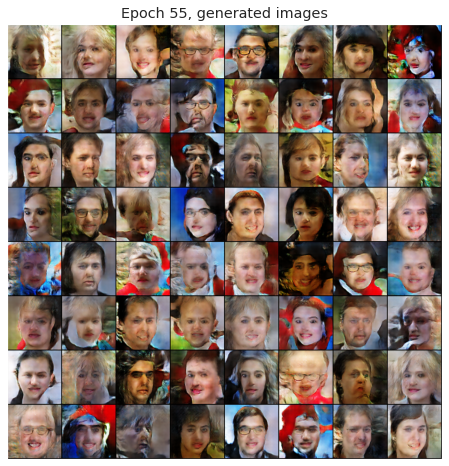

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [56/50], loss_g: 4.7351, loss_d: 0.3195, real_score: 0.8856, fake_score: 0.1099


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [57/50], loss_g: 4.9430, loss_d: 0.3449, real_score: 0.8870, fake_score: 0.1179


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [58/50], loss_g: 4.6416, loss_d: 0.2488, real_score: 0.9046, fake_score: 0.0920


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [59/50], loss_g: 4.9601, loss_d: 0.4041, real_score: 0.8741, fake_score: 0.1285


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [60/50], loss_g: 4.6797, loss_d: 0.2467, real_score: 0.9088, fake_score: 0.0897


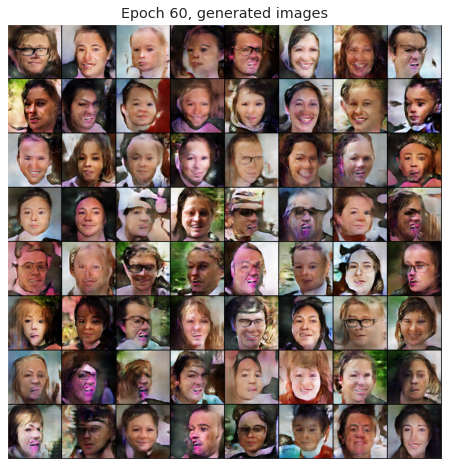

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [61/50], loss_g: 5.0492, loss_d: 0.3829, real_score: 0.8828, fake_score: 0.1169


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [62/50], loss_g: 4.7389, loss_d: 0.2037, real_score: 0.9194, fake_score: 0.0791


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [63/50], loss_g: 4.8274, loss_d: 0.2634, real_score: 0.9106, fake_score: 0.0869


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [64/50], loss_g: 5.0225, loss_d: 0.3227, real_score: 0.8961, fake_score: 0.1067


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [65/50], loss_g: 4.8946, loss_d: 0.1492, real_score: 0.9370, fake_score: 0.0626


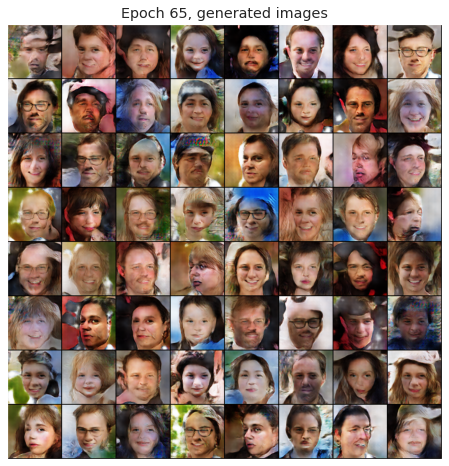

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [66/50], loss_g: 5.2379, loss_d: 0.3153, real_score: 0.8990, fake_score: 0.0990


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [67/50], loss_g: 5.1087, loss_d: 0.2123, real_score: 0.9213, fake_score: 0.0795


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [68/50], loss_g: 4.9511, loss_d: 0.1420, real_score: 0.9406, fake_score: 0.0538


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [69/50], loss_g: 5.1420, loss_d: 0.4885, real_score: 0.8741, fake_score: 0.1316


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [70/50], loss_g: 4.8035, loss_d: 0.1462, real_score: 0.9385, fake_score: 0.0613


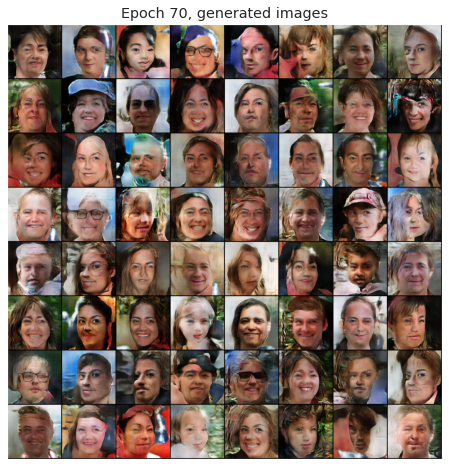

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [71/50], loss_g: 5.4969, loss_d: 0.2782, real_score: 0.9078, fake_score: 0.0893


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [72/50], loss_g: 5.2150, loss_d: 0.2887, real_score: 0.9085, fake_score: 0.0929


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [73/50], loss_g: 4.8982, loss_d: 0.1184, real_score: 0.9501, fake_score: 0.0496


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [74/50], loss_g: 5.5276, loss_d: 0.1201, real_score: 0.9516, fake_score: 0.0487


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [75/50], loss_g: 5.7867, loss_d: 0.1115, real_score: 0.9548, fake_score: 0.0444


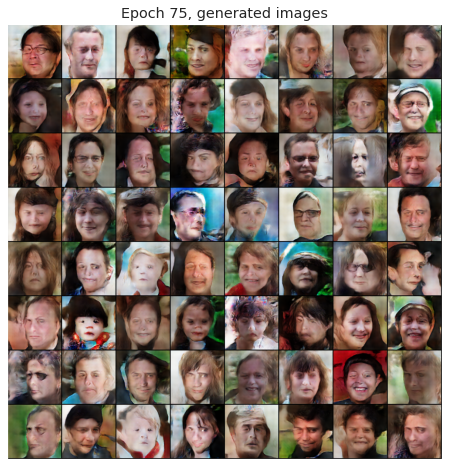

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [76/50], loss_g: 5.7301, loss_d: 0.1072, real_score: 0.9570, fake_score: 0.0429


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [77/50], loss_g: 6.1214, loss_d: 0.2443, real_score: 0.9223, fake_score: 0.0757


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [78/50], loss_g: 6.0691, loss_d: 0.1976, real_score: 0.9342, fake_score: 0.0681


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [79/50], loss_g: 5.8376, loss_d: 0.1097, real_score: 0.9565, fake_score: 0.0428


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [80/50], loss_g: 6.1559, loss_d: 0.1138, real_score: 0.9546, fake_score: 0.0421


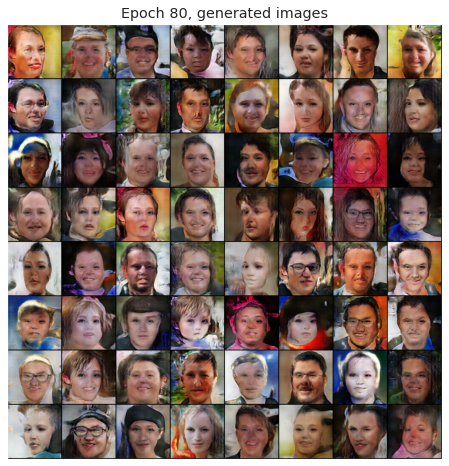

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [81/50], loss_g: 5.7281, loss_d: 0.5988, real_score: 0.8741, fake_score: 0.1296


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [82/50], loss_g: 5.3451, loss_d: 0.1596, real_score: 0.9424, fake_score: 0.0592


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [83/50], loss_g: 5.6453, loss_d: 0.1004, real_score: 0.9585, fake_score: 0.0411


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [84/50], loss_g: 5.6596, loss_d: 0.0842, real_score: 0.9644, fake_score: 0.0355


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [85/50], loss_g: 6.0807, loss_d: 0.1009, real_score: 0.9601, fake_score: 0.0397


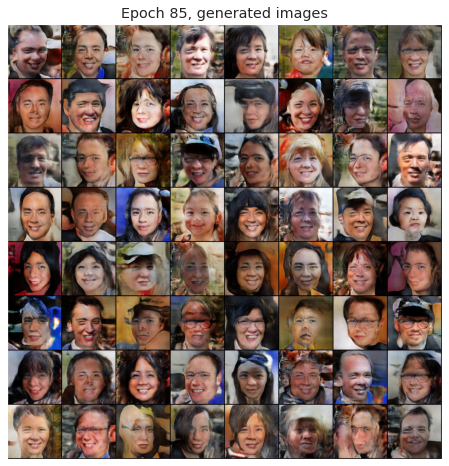

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [86/50], loss_g: 6.6618, loss_d: 0.2936, real_score: 0.9166, fake_score: 0.0818


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [87/50], loss_g: 6.2084, loss_d: 0.1430, real_score: 0.9496, fake_score: 0.0531


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [88/50], loss_g: 5.9476, loss_d: 0.1137, real_score: 0.9592, fake_score: 0.0399


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [89/50], loss_g: 6.1236, loss_d: 0.0574, real_score: 0.9750, fake_score: 0.0253


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [90/50], loss_g: 6.5654, loss_d: 0.3600, real_score: 0.9133, fake_score: 0.0887


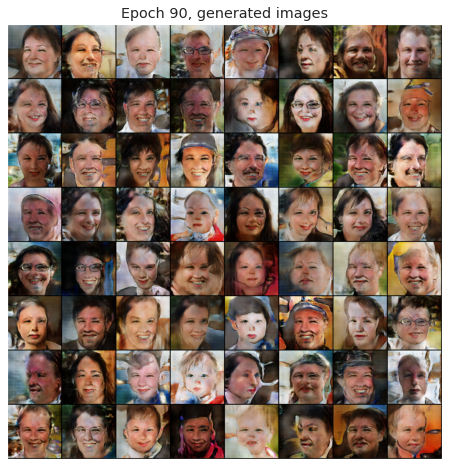

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [91/50], loss_g: 6.4180, loss_d: 0.2045, real_score: 0.9370, fake_score: 0.0640


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [92/50], loss_g: 5.6750, loss_d: 0.0751, real_score: 0.9663, fake_score: 0.0314


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [93/50], loss_g: 6.2453, loss_d: 0.1105, real_score: 0.9609, fake_score: 0.0404


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [94/50], loss_g: 6.3760, loss_d: 0.0617, real_score: 0.9740, fake_score: 0.0259


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [95/50], loss_g: 6.3634, loss_d: 0.0515, real_score: 0.9779, fake_score: 0.0224


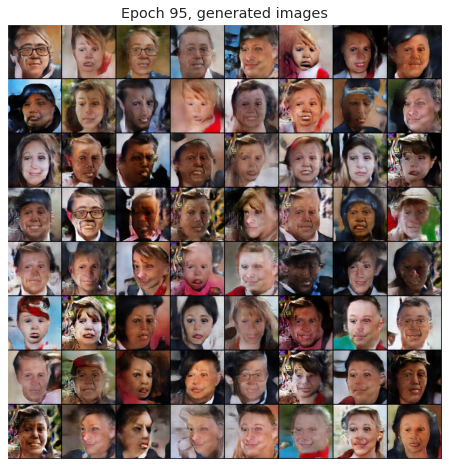

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [96/50], loss_g: 6.9578, loss_d: 0.1044, real_score: 0.9659, fake_score: 0.0342


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [97/50], loss_g: 6.9725, loss_d: 0.0706, real_score: 0.9726, fake_score: 0.0275


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [98/50], loss_g: 6.9628, loss_d: 0.0864, real_score: 0.9667, fake_score: 0.0269


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [99/50], loss_g: 7.6647, loss_d: 0.3549, real_score: 0.9246, fake_score: 0.0816


  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [100/50], loss_g: 6.5537, loss_d: 0.1466, real_score: 0.9497, fake_score: 0.0495


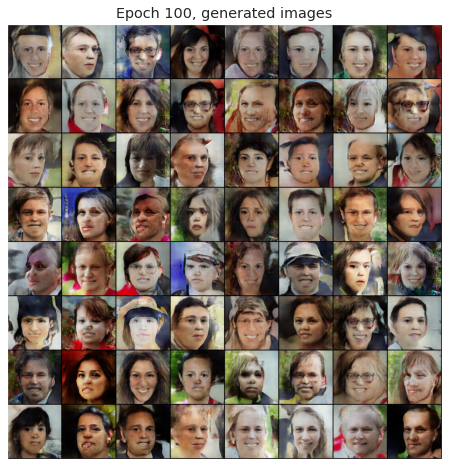

In [ ]:
# Эпохи 51-100
epochs = 50

history = fit(model, criterion, epochs, lr, start_epoch=50)

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

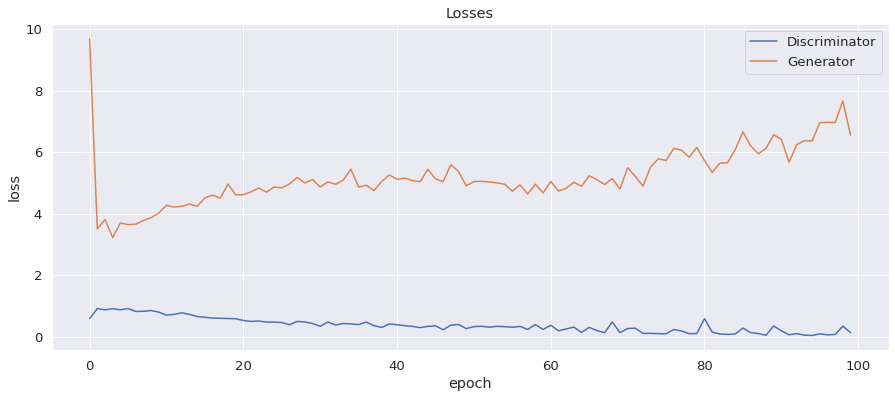

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

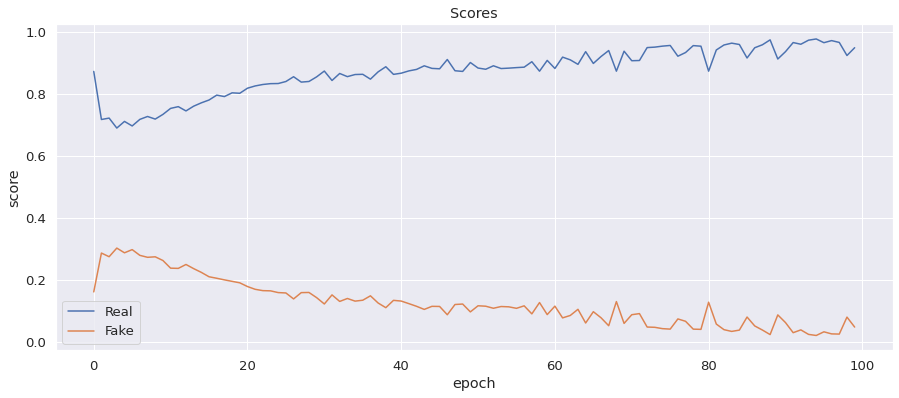

In [ ]:
plt.figure(figsize=(15, 6))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

In [ ]:
#Saving model
save_model(final=True)

In [ ]:
#Loading model 
path = os.path.join(CHECKPOINT_DIR, f'gan_weights_0100.pt')
checkpoint = torch.load(path, map_location=device)

discriminator.load_state_dict(checkpoint['discriminator_state_dict'])
generator.load_state_dict(checkpoint['generator_state_dict'])

<All keys matched successfully>

Постройте графики лосса для генератора и дискриминатора. Что вы можете сказать про эти графики?

*Вывод:*
Лосс классификатора в среднем падает на протяжении всех эпох, а лосс генератора растет.
Скор реальных фото в среднем растет и переходит отметку 95%. Скор сгенерированных фото неуклонно падает до 0.05. Это означает, что классификатор "выигрывает" у генератора.
Однако, как мы видим, во время обучения фотографии генерируются все боле похожие на реальные

## Часть 3. Генерация изображений (1 балл)

Теперь давайте оценим качество получившихся изображений. Напишите функцию, которая выводит изображения, сгенерированные нашим генератором

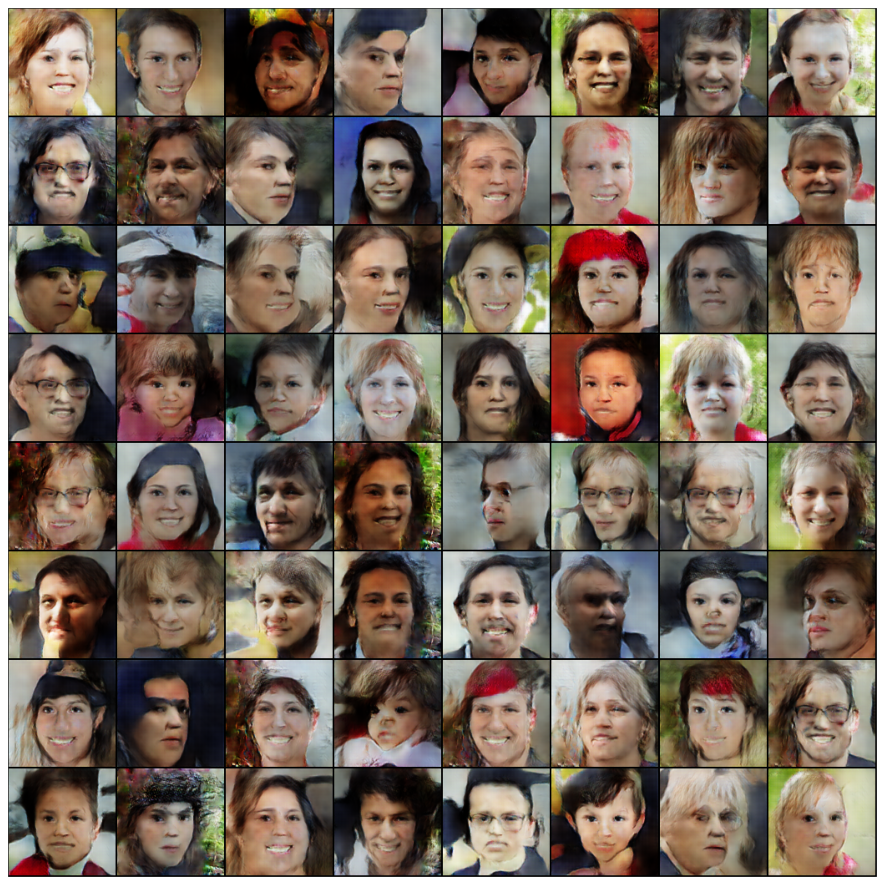

In [ ]:
n_images = 64

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model["generator"](fixed_latent)
show_images(fake_images, size=16)

Как вам качество получившихся изображений?

Видно, что изображения сгенерированны, однако:
1) Видно, что это лица
2) Они не такие размазанные, как при CVAE и VAE

## Часть 4. Leave-one-out-1-NN classifier accuracy (6 баллов)

### 4.1. Подсчет accuracy (4 балла)

Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы вам предлагается реализовать следующий подход:
  * Сгенерировать столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1.
  * Построить leave-one-out оценку: обучить 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах, кроме одного, проверить качество (accuracy) на оставшемся объекте. В этом вам поможет `sklearn.model_selection.LeaveOneOut`

In [ ]:
# Decrease batch_size (RAM reasons)
image_size = 128
batch_size = 16
train_dl = get_dataloader(image_size, batch_size)

# Download feature-extractor
weights = ResNet50_Weights.IMAGENET1K_V2
resnet = resnet50(weights=weights).to(device)
resnet.eval()

# Prepare extra preprocessing for feature-extractor
preprocess = weights.transforms()

# Cut the last layer
resnet.fc = nn.Identity()

# Get the features from real photos
real_features = torch.tensor([])
for batch in tqdm(train_dl):
  batch = preprocess(batch).to(device)
  features = resnet(batch).detach().cpu()
  real_features = torch.cat((real_features, features), dim=0)

# Take 1000 real images for kNN (RAM reasons)
imgs_total = real_features.shape[0]
num = 1000 
shuffle = np.random.permutation(imgs_total)[:num]
real_features = real_features[shuffle]
real_features.shape

  0%|          | 0/197 [00:00<?, ?it/s]

torch.Size([1000, 2048])

In [ ]:
# Generate 1000 fake images and extract features
batch_size = 8
fake_features = torch.tensor([])
for i in tqdm(range(125)):
  # generate imgs
  latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
  batch = model["generator"](latent).detach().cpu()
  batch = preprocess(batch).to(device)
  # features
  features = resnet(batch).detach().cpu()
  fake_features = torch.cat((fake_features, features), dim=0)

  0%|          | 0/125 [00:00<?, ?it/s]

In [ ]:
# kNN and LeaveOneOut
X = torch.cat((real_features, fake_features), dim=0).numpy()
y = torch.cat((torch.ones(1000), torch.zeros(1000)), dim=0).numpy()

loo = LeaveOneOut()
loo.get_n_splits(X)

actual = []
predicted = []

for train_index, test_index in tqdm(loo.split(X)):
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]

  classifier = KNeighborsClassifier(n_neighbors=1)  
  classifier.fit(X_train, y_train)
  y_pred = classifier.predict(X_test)

  actual.append(y_test[0])
  predicted.append(y_pred[0])
accuracy = accuracy_score(actual, predicted)
print('Accuracy: \t', accuracy)

0it [00:00, ?it/s]

Accuracy: 	 0.971


Что вы можете сказать о получившемся результате? Какой accuracy мы хотели бы получить и почему?

*Вывод:* Было сгенерировано 1000 фото, а также было взято 1000 реальных фото. Далее, мы выкидывали одно фото из 2000 (а точнее, фичи), обучали 1-NN и предсказывали класс оставшегося фото (реальное или сгенерированное). Полученное accuracy (=0.97) показывает, что 1-NN отличает сгенерированное фото от реального и правильно предсказывает класс. Идеальный результат 1-NN, к которому мы стремимся, равен 0.5. Accuracy=0.5 означает, что классификатор 1-NN не может отличить реальное от сгенерированного фото, то есть эквивалентен подбрасыванию монетки. Сгенерированные фото далеки от идеала, что мы видим глазами, и что подтверждает 1-NN.

### 4.2. Визуализация распределений (2 балла)

Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуйтесь методом, снижающим размерность (к примеру, TSNE) и изобразите на графике разным цветом точки, соответствующие реальным и сгенерированным изображенияи

Прокомментируйте получившийся результат:

Feature-space before TSNE, dims: (2000, 2048)
Feature-space after TSNE, dims: (2000, 2)


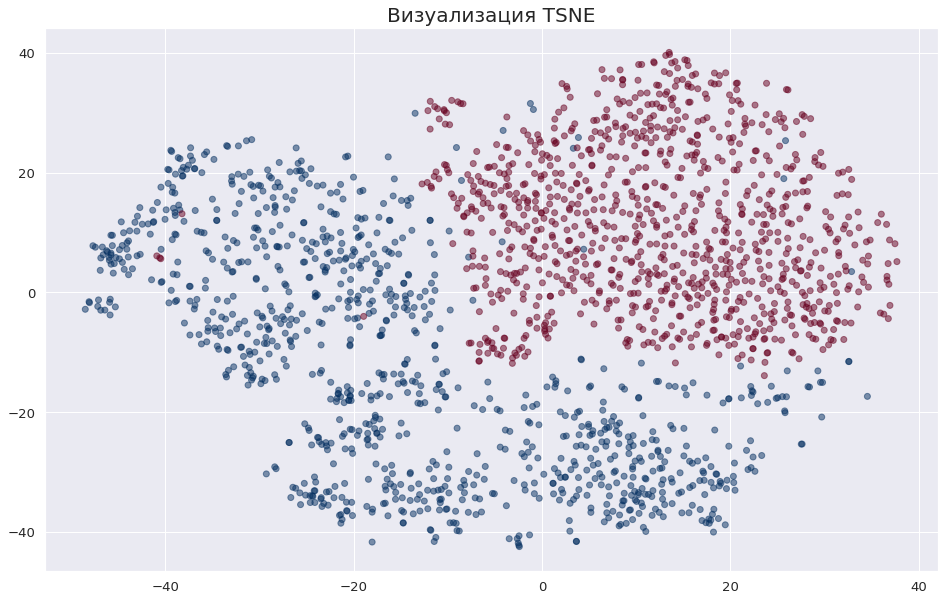

In [ ]:
print(f'Feature-space before TSNE, dims: {X.shape}')

# TSNE 
tsne = TSNE(n_components=2, learning_rate='auto', init='random')
X_tsne = tsne.fit_transform(X)
print(f'Feature-space after TSNE, dims: {X_tsne.shape}')

# visualisation
fig, ax = plt.subplots(figsize=(16,10))
scatter = ax.scatter(x=X_tsne[:,0], y=X_tsne[:, 1], c=y, cmap='RdBu', alpha=0.5)
plt.title('Визуализация TSNE', fontsize=20);

*Вывод:*
Облака точек, соответствующие реальным и сгенерированным изображениям, хорошо разделены друг от друга, однакочуть-чуть на границе есть небольшое перемешивание. Точки не перемешаны, что означает, что фичи 2х классов отличаются.